In [12]:
import h5py
import numpy as np
from scipy.spatial.transform import Rotation as R
import matplotlib.pyplot as plt
%matplotlib notebook
%matplotlib inline
from mpl_toolkits import mplot3d 
import trimesh
import pyrender
import nexusformat.nexus as nx
from PIL import Image
import io
import colorsys 
from matplotlib.patches import Rectangle
from torchvision import transforms
import torch
import glob
import os

In [4]:
 def HSVToRGB(h, s, v): 
    (r, g, b) = colorsys.hsv_to_rgb(h, s, v) 
    return (int(255*r), int(255*g), int(255*b)) 
 
def getDistinctColors(n): 
    huePartition = 1.0 / (n + 1) 
    return np.array(list((HSVToRGB(huePartition * value, .4, .5) for value in range(0, n))))/255.0
        
def draw3DRectangle(ax, x1, y1, z1, x2, y2, z2, color):
#     ax.set_xlim(-2, 2)
#     ax.set_ylim(-2, 2)
#     ax.set_zlim(-2, 2)
    # the Translate the datatwo sets of coordinates form the apposite diagonal points of a cuboid
    ax.plot([x1, x2], [y1, y1], [z1, z1], color=color) # | (up)
    ax.plot([x2, x2], [y1, y2], [z1, z1], color=color) # -->
    ax.plot([x2, x1], [y2, y2], [z1, z1], color=color) # | (down)
    ax.plot([x1, x1], [y2, y1], [z1, z1], color=color) # <--

    ax.plot([x1, x2], [y1, y1], [z2, z2], color=color) # | (up)
    ax.plot([x2, x2], [y1, y2], [z2, z2], color=color) # -->
    ax.plot([x2, x1], [y2, y2], [z2, z2], color=color) # | (down)
    ax.plot([x1, x1], [y2, y1], [z2, z2], color=color) # <--
    
    ax.plot([x1, x1], [y1, y1], [z1, z2], color=color) # | (up)
    ax.plot([x2, x2], [y2, y2], [z1, z2], color=color) # -->
    ax.plot([x1, x1], [y2, y2], [z1, z2], color=color) # | (down)
    ax.plot([x2, x2], [y1, y1], [z1, z2], color=color) # <--

def draw3DRectangleBox(ax, edges, pts, color):
#     ax.set_xlim(-2, 2)
#     ax.set_ylim(-2, 2)
#     ax.set_zlim(-2, 2)
    # the Translate the datatwo sets of coordinates form the apposite diagonal points of a cuboid
    for edge in edges:
        x1, y1, z1 = pts[edge[0]]
        x2, y2, z2 = pts[edge[1]]
        ax.plot([x1, x2], [y1, y2], [z1, z2], color=color) # | (up

    ax.scatter(pts[:, 0], pts[:, 1], pts[:, 2], color=color)
    
def scatter_pts(pts):
    fig = plt.figure()    
    ax = fig.add_subplot(111, projection='3d')
    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    ax.set_zlim(-2, 2)
    ax.view_init(elev=100., azim=-90)
    ax.scatter(pts[:, 0], pts[:, 1], pts[:, 2])
    return

In [5]:
filepath = "/Users/eliwang/physion_data/drop/readout_human_redyellow/pilot_it2_drop_all_bowls_box/0000.hdf5"
filepath = '/Users/eliwang/Downloads/pilot_towers_nb5_fr015_SJ030_mono0_dis0_occ0_boxroom_0047.hdf5'
f = h5py.File(filepath)
name = filepath.split('/')[-1].split('.')[0]
# print(nx.nxload(filepath).tree)

In [6]:
print(nx.nxload(filepath).tree)

root:NXroot
  frames:NXgroup
    0000:NXgroup
      camera_matrices:NXgroup
        camera_matrix = float32(16)
        projection_matrix = float32(16)
      collisions:NXgroup
        contacts = float64(27x2x3)
        object_ids = int32(7x2)
        relative_velocities = float64(7x3)
        states = ['enter', 'enter', 'enter', 'enter', 'enter', 'enter', '...
      env_collisions:NXgroup
        contacts = float64(6x2x3)
        object_ids = [4 3]
      images:NXgroup
        _id = uint8(2547)
        _img = uint8(82108)
      labels:NXgroup
        did_fall = False
        has_target = True
        has_zone = True
        target_contacting_zone = False
        target_delta_position = [0. 0. 0.]
        target_has_moved = False
        target_on_ground = False
        trial_complete = False
        trial_end = False
        trial_timeout = False
      objects:NXgroup
        angular_velocities = float32(8x3)
        back = float32(8x3)
        bottom = float32(8x3)
        center = f

In [76]:
def get_camera_matrix(f):
    projection_matrix =  np.array(f['frames']['0000']['camera_matrices']['projection_matrix']).reshape(4,4)
    camera_matrix =  np.array(f['frames']['0000']['camera_matrices']['camera_matrix']).reshape(4,4)
    return np.matmul(projection_matrix, camera_matrix)

def project_points(points, camera_matrix):
    assert points.ndim == 2
    assert points.shape[1] == 3
    
    points = np.pad(points, [(0,0), (0,1)], constant_values=1).T
    projected_points = np.matmul(camera_matrix, points).T
    projected_points = projected_points / projected_points[:,-1:]
    return projected_points

def compute_bbox_from_projected_pts(points):
    assert points.ndim == 2
    assert points.shape[1] == 4
    x1 = np.min(points[:,0])
    y1 = np.min(-points[:,1]) # flip y
    x2 = np.max(points[:,0])
    y2 = np.max(-points[:,1]) # flip y
    xyxy = rescale_xyxy(np.array([x1, y1, x2, y2]))
    return xyxy

def compute_bboxes(points, f):
    camera_matrix = get_camera_matrix(f)
    ppoints = project_points(points, camera_matrix)
    xyxy = compute_bbox_from_projected_pts(ppoints)
    return xyxy

def rescale_xyxy(xyxy):
    xyxy = np.clip(xyxy, -1, 1) # ensure [-1,1]
    xyxy = (xyxy + 1.) / 2. # scale to [0,1]
    return xyxy

def get_vertices_scaled(f, obj_id):
    
    vertices_orig = np.array(f['static']['mesh']['vertices_' + str(obj_id)])

    scales = f["static"]["scale"][:]

    vertices_orig[:,0] *= scales[obj_id, 0]
    vertices_orig[:,1] *= scales[obj_id, 1]
    vertices_orig[:,2] *= scales[obj_id, 2]
    faces_orig = np.array(f['static']['mesh']['faces_' + str(obj_id)])
    
    return vertices_orig, faces_orig

def get_full_bbox(vertices):
    arr1 = vertices.min(0)
    
    arr2 = vertices.max(0)
    
    arr = np.stack([arr1, arr2], 0)
    
    pts = [(0, 0, 0), (0, 0, 1), (0, 1, 1), (0, 1, 0) , (1, 0, 0), (1, 0, 1), (1, 1, 1), (1, 1, 0)]
         
    all_edges = [(0, 1), (1, 2), (2, 3), (3, 0),  (4, 5), (5, 6), (6, 7), (7, 4), (0, 4), (1, 5), (2, 6), (3, 7)]
    
    all_faces = [(0, 1, 2, 3), (4, 5, 6, 7), (2, 3, 6, 7), (1, 0, 4, 5), (1, 2, 6, 5), \
                (0, 4, 7, 3)]    
    
    index = np.arange(3)
    
    all_pts = []
    for pt in pts:
        p1 = arr[pt, index]
        all_pts.append(p1)
    
    all_pts = np.stack(all_pts, 0)
    
    return all_pts, all_edges, all_faces    


def get_transformed_pts(f, pts, frame, obj_id):
    rotations_0 = np.array(f['frames'][frame]['objects']['rotations'][obj_id])
    positions_0 = np.array(f['frames'][frame]['objects']['positions'][obj_id])
    
    rot = R.from_quat(rotations_0).as_matrix()
    trans = positions_0
    transformed_pts = np.matmul(rot, pts.T).T + np.expand_dims(trans, axis=0)
    
    return transformed_pts

def bbox_to_corners(x1, y1, x2, y2):
    return [(x,y) for x in [x1,x2] for y in [y1,y2]]

def get_frame(frame_no, lbl='_img'):
    frame = str(frame_no).zfill(4)
    img = f['frames'][frame]['images'][lbl][()]
    if img.ndim == 1:
        img = Image.open(io.BytesIO(img)) # (256, 256, 3)
    return np.array(img)

def get_ax(fig):
    ax = fig.add_subplot(projection='3d')
    ax.set_xlim(-2, 2)
    ax.set_ylim(-0.5, 2)
    ax.set_zlim(-2, 2)
    ax.view_init(elev=30., azim=30, vertical_axis='y')
    return ax

def plot_box(pts, colors, close=False):
    fig = plt.figure(figsize=[20, 20])
    ax = fig.add_subplot(projection='3d')
    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    ax.set_zlim(-2, 2)
    ax.view_init(elev=100., azim=-90)
    ax.scatter(pts[:, 0], pts[:, 1], pts[:, 2], c=colors)
    return fig

def xyxy_to_xywh(x1, y1, x2, y2):
    x = (x1+x2)/2
    y = (y1+y2)/2
    w = (x2-x1)/2
    h = (y2-y1)/2
    return x,y,w,h

def xywh_to_xyxy(x, y, w, h):
    x1 = x - w
    x2 = x + w
    y1 = y - h
    y2 = y + h
    return x1,y1,x2,y2

def compute_bboxes_from_mask(id_img, colors, tol=0.1):
    bboxes = []
    for color in colors:
        if not color.any(): # all zeros
            continue
        idxs = np.argwhere(id_img==color)
        if len(idxs) > 0:
            x1 = np.min(idxs[:,1])
            x2 = np.max(idxs[:,1])
            y1 = np.min(idxs[:,0])
            y2 = np.max(idxs[:,0])
            xyxy = np.array([x1,y1,x2,y2])
            x,y,w,h = xyxy_to_xywh(*xyxy)
            w, h = w*(1+tol), h*(1+tol)
            xyxy = np.clip(xywh_to_xyxy(x,y,w,h), 0, id_img.shape[0]-1).astype(np.uint8)
        else:
            xyxy = -np.ones(4)
        bboxes.append(xyxy)
    return bboxes

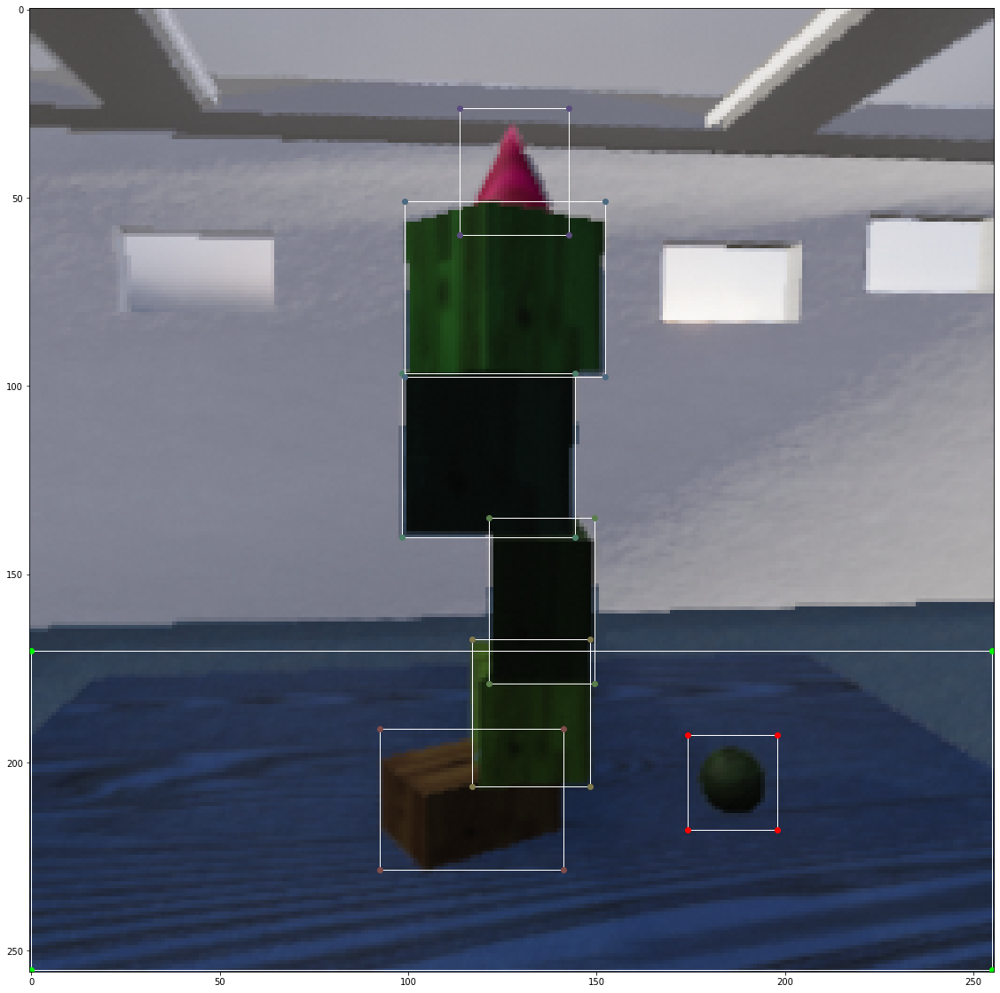

In [102]:
filepath = "/Users/eliwang/physion_data/drop/readout_human_redyellow/pilot_it2_drop_all_bowls_box/0000.hdf5"
filepath = '/Users/eliwang/Downloads/pilot_towers_nb5_fr015_SJ030_mono0_dis0_occ0_boxroom_0047.hdf5'
f = h5py.File(filepath)

object_ids = np.array(f['static']['object_ids'])
colors = [[0, 1, 0], [1, 0, 0]] + list(getDistinctColors(len(object_ids)-2))

for frame_no in range(0, 10, 10):
    plt.figure(figsize=(20,20))
    rgb_img = get_frame(frame_no, '_img')
    id_img = get_frame(frame_no, '_id')
    plt.imshow(rgb_img)
    for i, obj_id in enumerate(object_ids):
        obj_id = i #obj_id-1    

        vertices_orig, faces_orig = get_vertices_scaled(f, obj_id)

        all_pts, all_edges, all_faces = get_full_bbox(vertices_orig)

        frame_pts = get_transformed_pts(f, all_pts, str(frame_no).zfill(4), obj_id)
        xyxy = compute_bboxes(frame_pts, f)*255
        
        corners = bbox_to_corners(*xyxy)
        
        currentAxis = plt.gca()
        currentAxis.add_patch(Rectangle((xyxy[0],xyxy[1]), xyxy[2]-xyxy[0], xyxy[3]-xyxy[1], fill=None, alpha=1, color='w'))
        for c in corners:
            plt.scatter(c[0], c[1], color=colors[obj_id])
    plt.show()

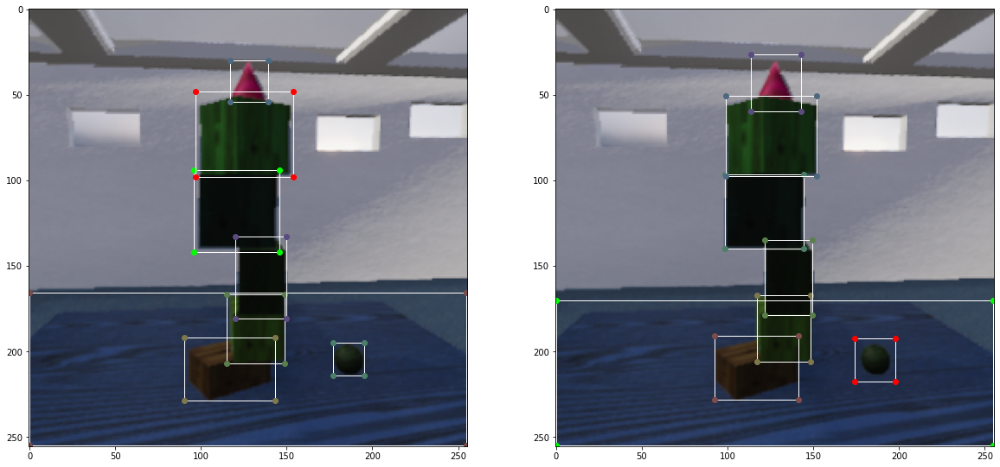

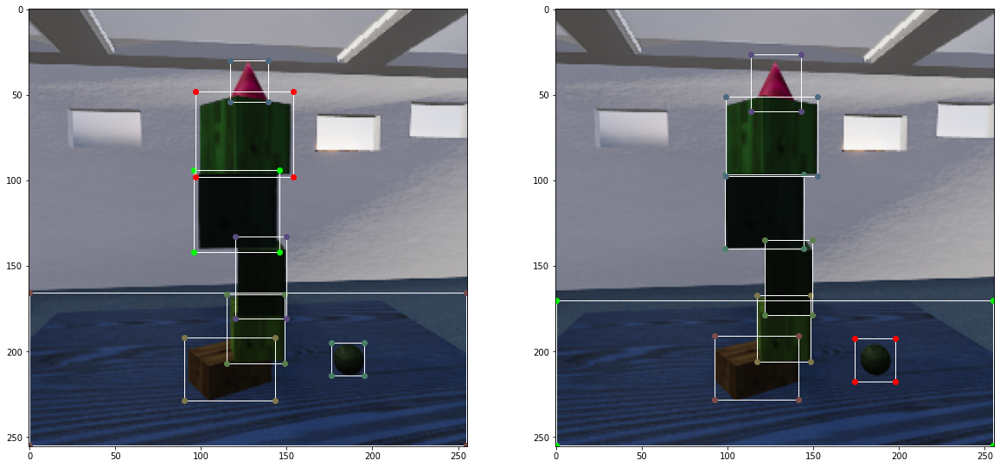

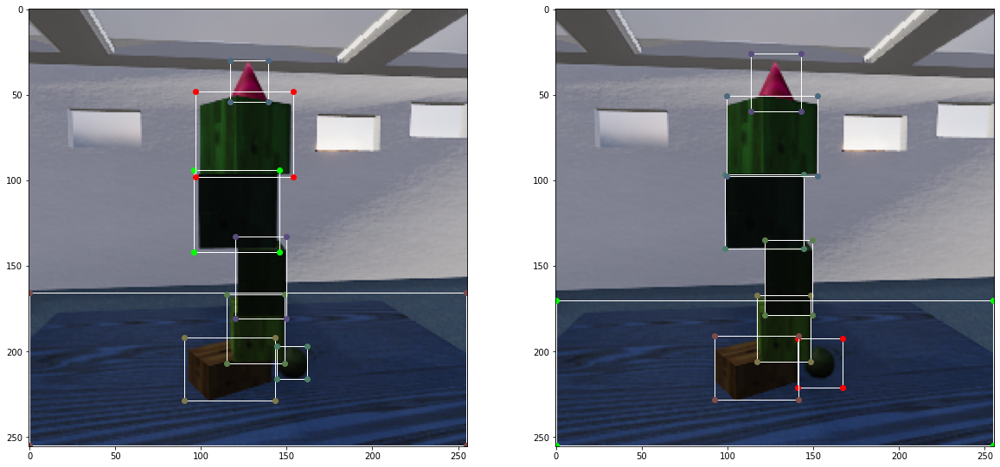

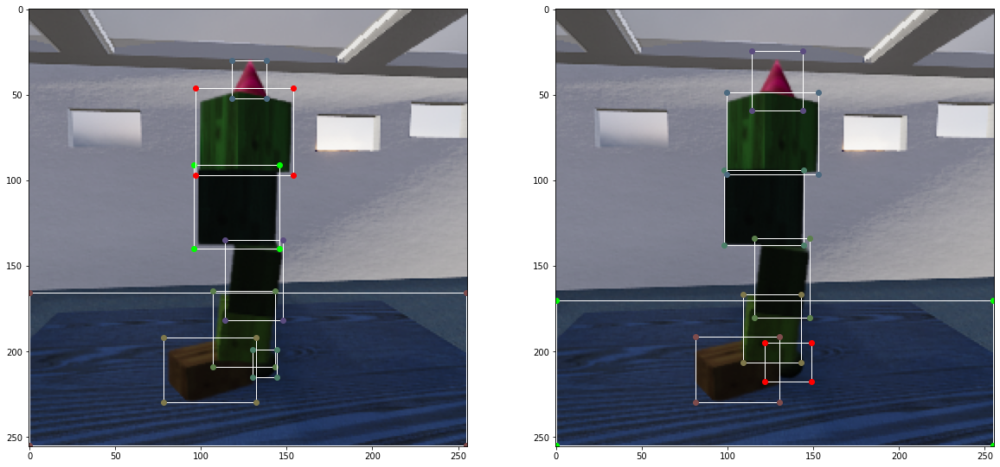

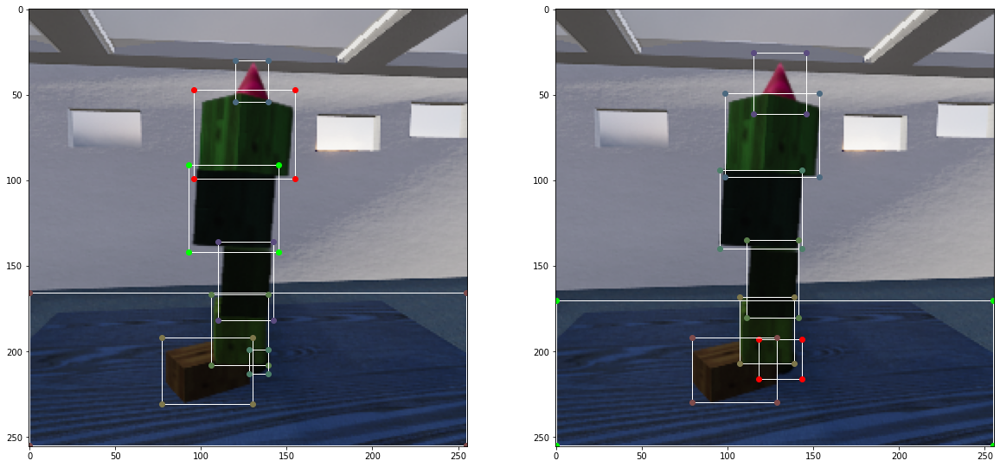

...

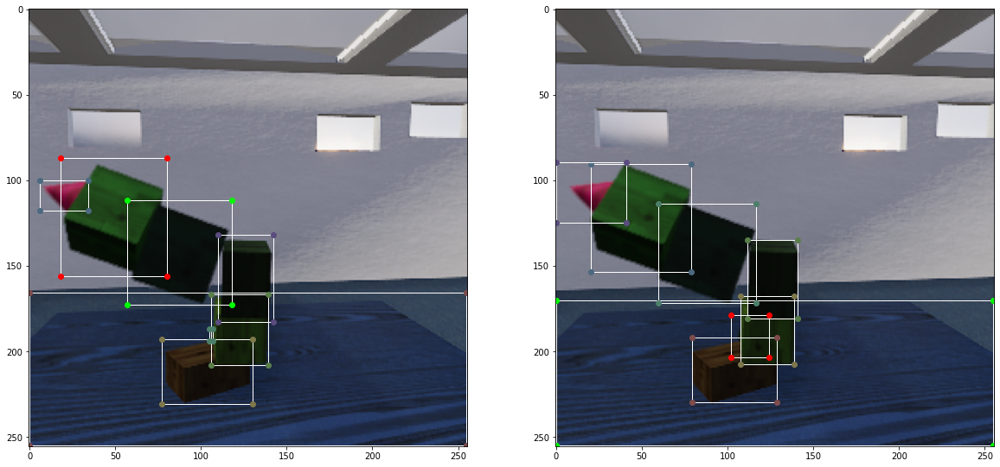

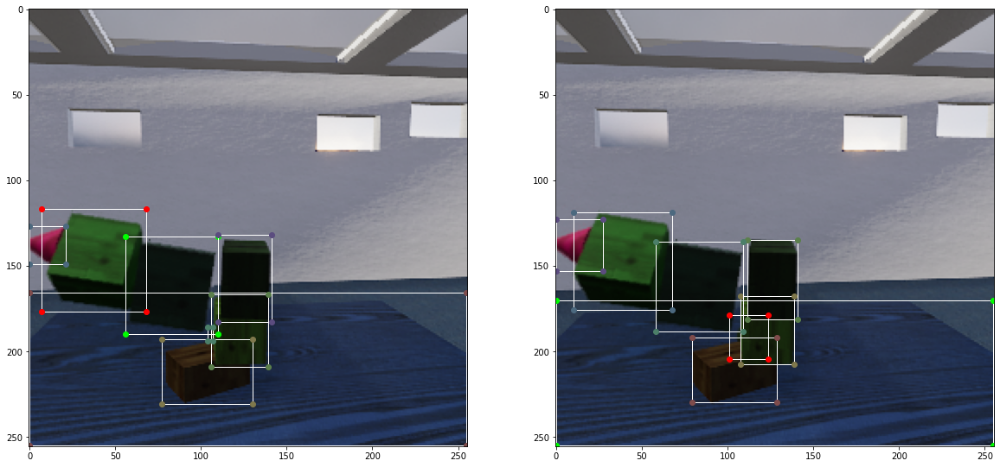

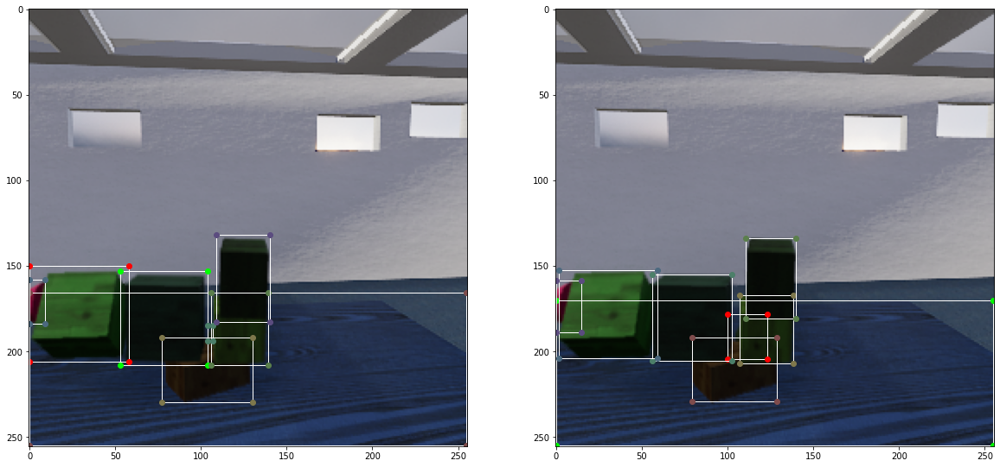

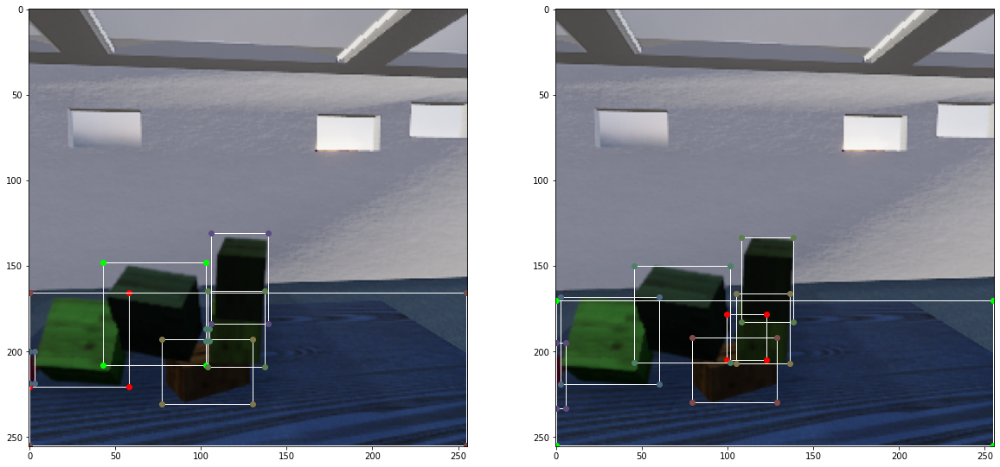

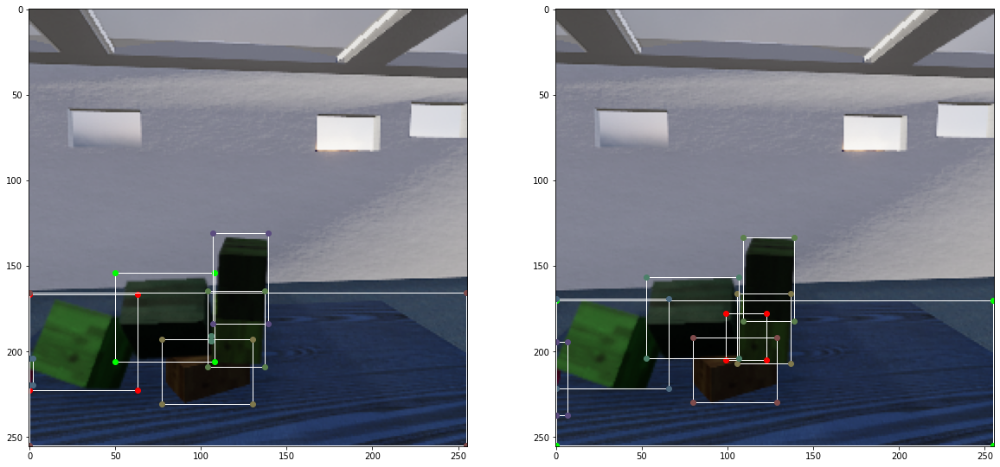

In [99]:
# filepath = "/Users/eliwang/physion_data/drop/readout_human_redyellow/pilot_it2_drop_all_bowls_box/0003.hdf5"
filepath = '/Users/eliwang/Downloads/pilot_towers_nb5_fr015_SJ030_mono0_dis0_occ0_boxroom_0047.hdf5'
f = h5py.File(filepath)

object_ids = np.array(f['static']['object_ids'])
colors = [[0, 1, 0], [1, 0, 0]] + list(getDistinctColors(len(object_ids)-2))

for frame_no in range(0, 300, 10):
    _, axarr = plt.subplots(1,2, figsize=(20,20))
    rgb_img = get_frame(frame_no, '_img')
    id_img = get_frame(frame_no, '_id')
    axarr[0].imshow(rgb_img)
    bboxes = compute_bboxes_from_mask(id_img)
    for obj_id, xyxy in enumerate(bboxes):
        corners = bbox_to_corners(*xyxy)
        
        axarr[0].add_patch(Rectangle((xyxy[0],xyxy[1]), xyxy[2]-xyxy[0], xyxy[3]-xyxy[1], fill=None, alpha=1, color='w'))
        for c in corners:
            axarr[0].scatter(c[0], c[1], color=colors[obj_id])
    
    axarr[1].imshow(rgb_img)
    for i, obj_id in enumerate(object_ids):
        obj_id = i #obj_id-1    

        vertices_orig, faces_orig = get_vertices_scaled(f, obj_id)

        all_pts, all_edges, all_faces = get_full_bbox(vertices_orig)

        frame_pts = get_transformed_pts(f, all_pts, str(frame_no).zfill(4), obj_id)
        xyxy = compute_bboxes(frame_pts, f)*255
        
        corners = bbox_to_corners(*xyxy)
        
        axarr[1].add_patch(Rectangle((xyxy[0],xyxy[1]), xyxy[2]-xyxy[0], xyxy[3]-xyxy[1], fill=None, alpha=1, color='w'))
        for c in corners:
            axarr[1].scatter(c[0], c[1], color=colors[obj_id])
    plt.show()

In [57]:
def get_seq(filepath, subsample_factor=9, seq_len=16, imsize=224, random_seq=True):
    with h5py.File(filepath, 'r') as f:
        frames = list(f['frames'])
        target_contacted_zone = False
        for frame in reversed(frames):
            lbl = f['frames'][frame]['labels']['target_contacting_zone'][()]
            if lbl: # as long as one frame touching, label is True
                target_contacted_zone = True
                break

        assert len(frames)//subsample_factor >= seq_len, 'Images must be at least len {}, but are {}'.format(seq_len, len(frames)//subsample_factor)
        if random_seq: # randomly sample sequence of seq_len
            start_idx = np.random.randint(len(frames)-(seq_len*subsample_factor)+1)
        else: # get first seq_len # of frames
            start_idx = 0
        end_idx = start_idx + (seq_len*subsample_factor)
        images = []
        img_transforms = transforms.Compose([
            # transforms.Resize((imsize, imsize)),
            transforms.ToTensor(),
            ])
        for frame in frames[start_idx:end_idx:subsample_factor]:
            img = f['frames'][frame]['images']['_img'][()]
            if img.ndim == 1:
                img = Image.open(io.BytesIO(img)) # (256, 256, 3)
            else:
                img = Image.fromarray(img)
            img = img_transforms(img)
            images.append(img)

        images = torch.stack(images, dim=0)
        labels = torch.ones((seq_len, 1)) if target_contacted_zone else torch.zeros((seq_len, 1)) # Get single label over whole sequence
        stimulus_name = f['static']['stimulus_name'][()]

In [83]:
def write_new_hdf5(fp, group):
    for filepath in sorted(glob.glob(fp.format(group))):
        new_fp = filepath.replace(group, group+'_new').replace('data5', 'data1')
        os.makedirs(os.path.dirname(new_fp), exist_ok=True)
        with h5py.File(filepath, 'r') as f, h5py.File(new_fp, 'w') as hf:
            id_img = np.array(f['frames']['0000']['images']['_id'][()]) # first frame, assumes all objects are in view
            id_img = np.array(Image.open(io.BytesIO(id_img))) # (256, 256, 3)
            colors = np.unique(id_img.reshape(-1, id_img.shape[2]), axis=0) # full list of unique colors in id map
            frames = list(f['frames'])
            for frame in frames:
                img = f['frames'][frame]['images']['_img'][()]
                img = Image.open(io.BytesIO(img)) # (256, 256, 3)
                img = np.array(img, dtype=np.uint8)
                hf.create_dataset(f'frames/{frame}/images/_img', data=img)

                lbl = f['frames'][frame]['labels']['target_contacting_zone'][()]
                hf.create_dataset(f'frames/{frame}/labels/target_contacting_zone', data=lbl)

                id_img = f['frames'][frame]['images']['_id'][()]
                id_img = np.array(Image.open(io.BytesIO(id_img))) # (256, 256, 3)
                bboxes = compute_bboxes_from_mask(id_img, colors)
                hf.create_dataset(f'frames/{frame}/bboxes', data=bboxes)   
                
                object_ids = np.array(f['static']['object_ids'])
                bboxes2 = []
                for i, obj_id in enumerate(object_ids):
                    obj_id = i
                    vertices_orig, faces_orig = get_vertices_scaled(f, obj_id)
                    if len(vertices_orig) == 0:
                        xyxy = -np.ones(4)
                    else:
                        all_pts, all_edges, all_faces = get_full_bbox(vertices_orig)

                        frame_pts = get_transformed_pts(f, all_pts, frame, obj_id)
                        xyxy = compute_bboxes(frame_pts, f)*(img.shape[0]-1)
                    bboxes2.append(xyxy)
                bboxes2 = np.array(bboxes2, dtype=np.uint8)
                hf.create_dataset(f'frames/{frame}/bboxes2', data=bboxes2)

            stimulus_name = f['static']['stimulus_name'][()]
            hf.create_dataset('static/stimulus_name', data=stimulus_name)


In [84]:
write_new_hdf5('/data5/eliwang/physion_data/{}/*/*.hdf5', 'pretraining_train')

RuntimeError: Dirty entry flush destroy failed (file write failed: time = Wed Mar  9 04:45:55 2022
, filename = '/data1/eliwang/physion_data/pretraining_train_new/Drop/pilot_it2_drop_all_bowls_tdw_2_dis_2_occ_0058.hdf5', file descriptor = 93, errno = 28, error message = 'No space left on device', buf = 0x7770de8, total write size = 4256, bytes this sub-write = 4256, bytes actually written = 18446744073709551615, offset = 0)

In [58]:
%%prun
get_seq('/data1/eliwang/physion_data/pretraining_train_new/Collide/pilot_it2_collision_assorted_targets_box_0000.hdf5')

         13421 function calls (13336 primitive calls) in 3.271 seconds

   Ordered by: internal time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
       16    0.850    0.053    0.850    0.053 {method 'div' of 'torch._C._TensorBase' objects}
       16    0.772    0.048    0.772    0.048 {method 'to' of 'torch._C._TensorBase' objects}
        1    0.722    0.722    0.722    0.722 {built-in method stack}
       16    0.715    0.045    0.715    0.045 {method 'contiguous' of 'torch._C._TensorBase' objects}
      275    0.048    0.000    0.115    0.000 group.py:279(__getitem__)
      713    0.040    0.000    0.040    0.000 {method 'rpartition' of 'str' objects}
       16    0.021    0.001    0.024    0.002 Image.py:684(__array__)
     2233    0.016    0.000    0.016    0.000 {built-in method builtins.isinstance}
       69    0.016    0.000    0.016    0.000 filters.py:286(get_filters)
       69    0.015    0.000    0.015    0.000 dataset.py:480(dtype)
        1   

In [59]:
%%prun
get_seq('/data5/eliwang/physion_data/pretraining_train/Collide/pilot_it2_collision_assorted_targets_box_0000.hdf5')

         16473 function calls (16388 primitive calls) in 3.484 seconds

   Ordered by: internal time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
       16    0.852    0.053    0.852    0.053 {method 'div' of 'torch._C._TensorBase' objects}
        1    0.841    0.841    0.841    0.841 {built-in method stack}
       16    0.783    0.049    0.783    0.049 {method 'contiguous' of 'torch._C._TensorBase' objects}
       16    0.751    0.047    0.751    0.047 {method 'to' of 'torch._C._TensorBase' objects}
      207    0.146    0.001    0.146    0.001 {method 'decode' of 'ImagingDecoder' objects}
      275    0.024    0.000    0.025    0.000 base.py:177(_e)
      275    0.015    0.000    0.050    0.000 group.py:279(__getitem__)
        1    0.013    0.013    3.484    3.484 944752032.py:1(get_seq)
       69    0.009    0.000    0.023    0.000 dataset.py:688(__getitem__)
     2197    0.007    0.000    0.007    0.000 {built-in method builtins.isinstance}
       69  

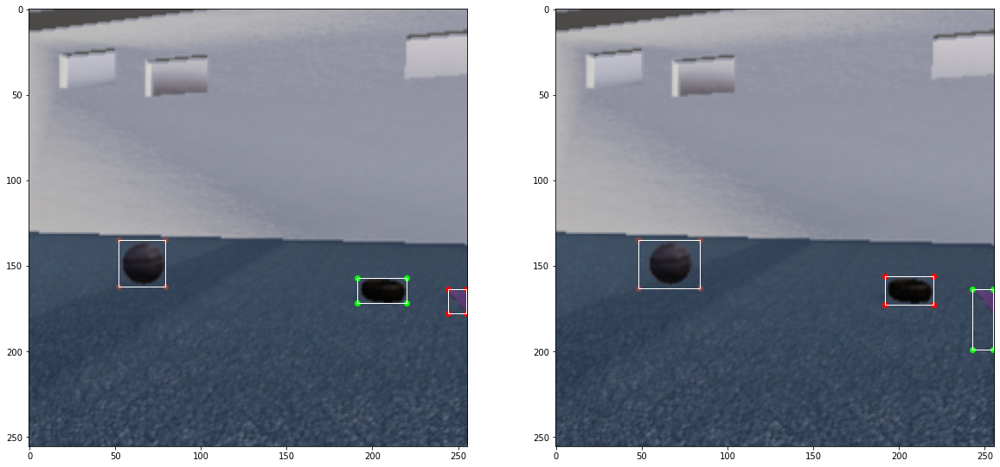

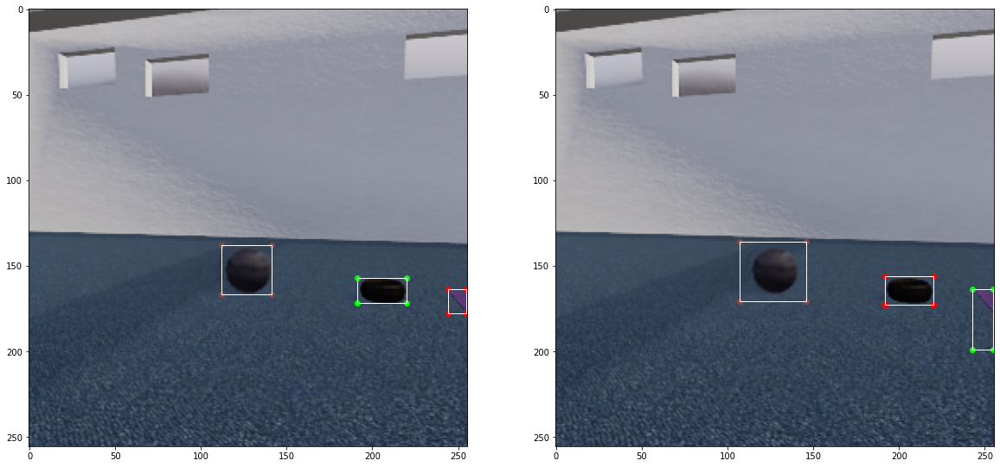

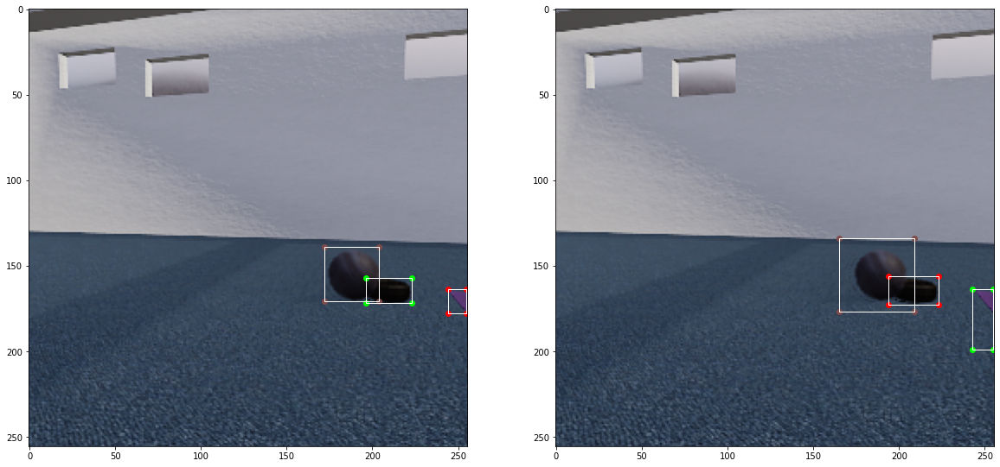

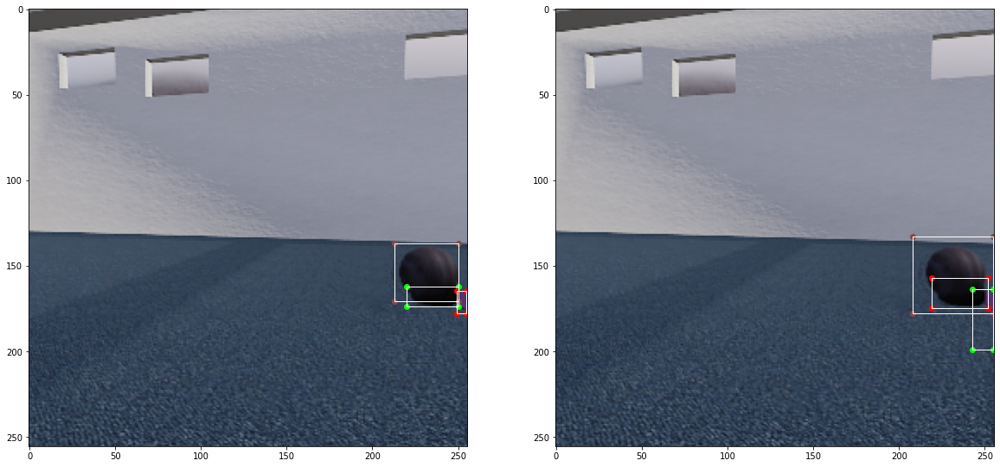

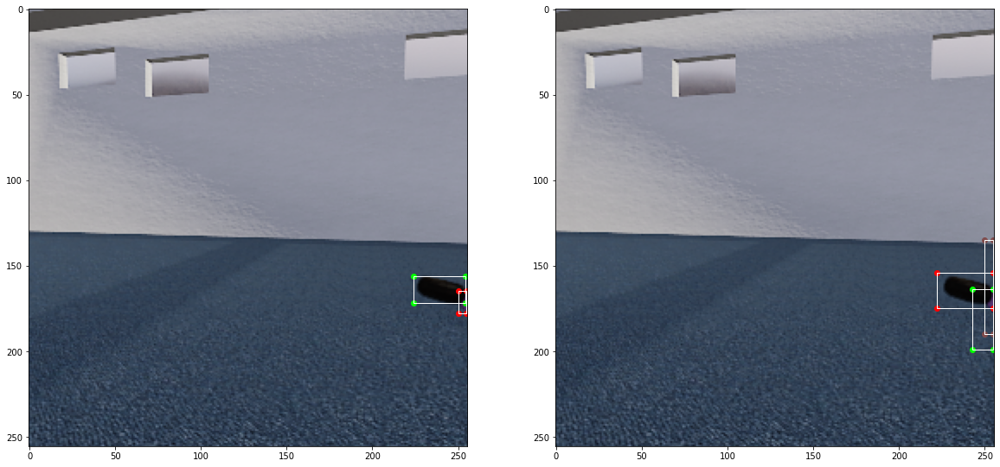

...

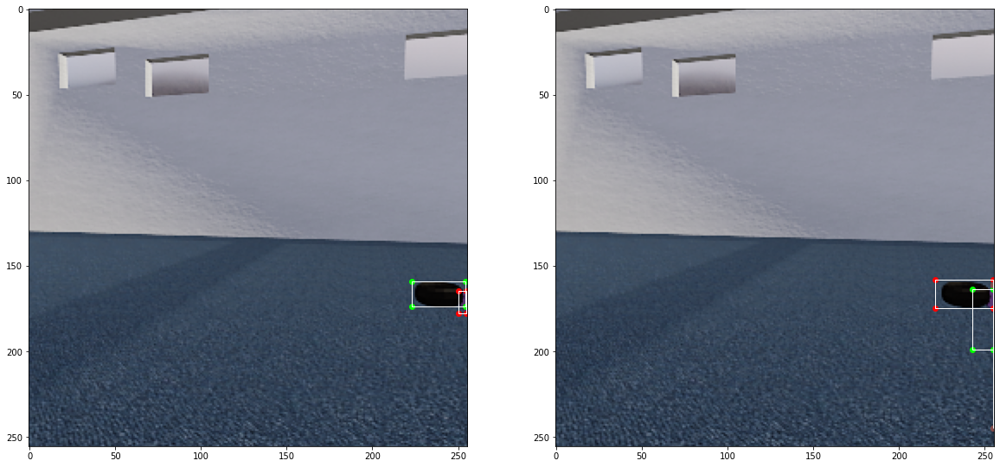

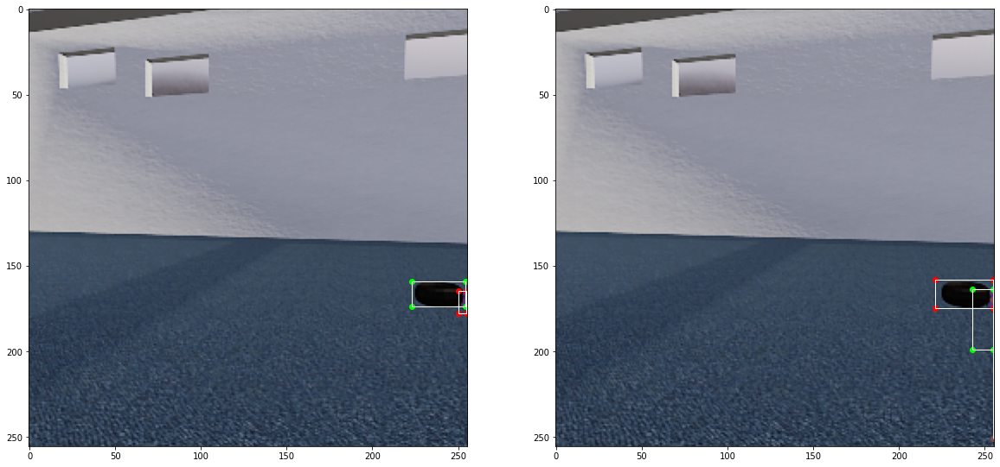

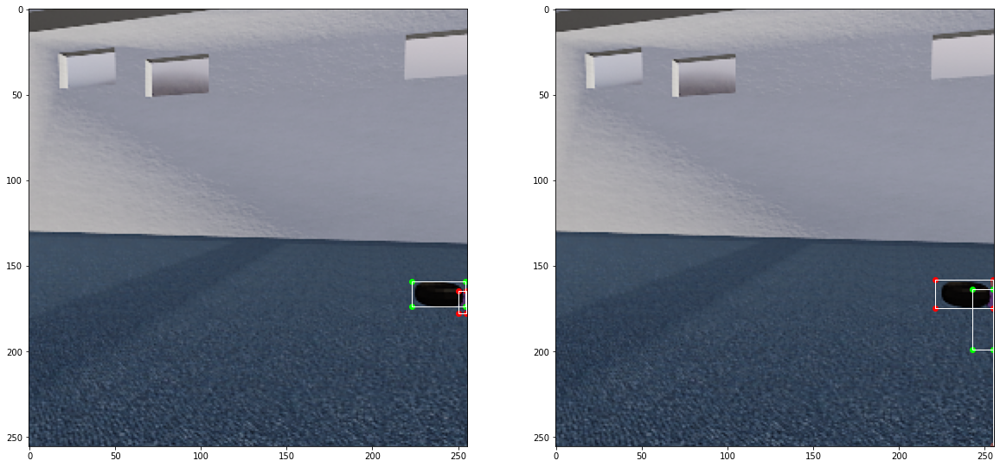

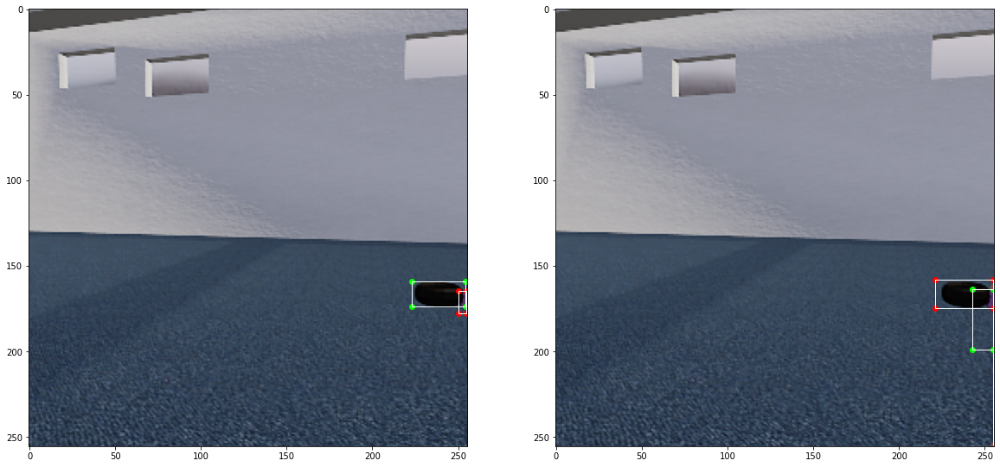

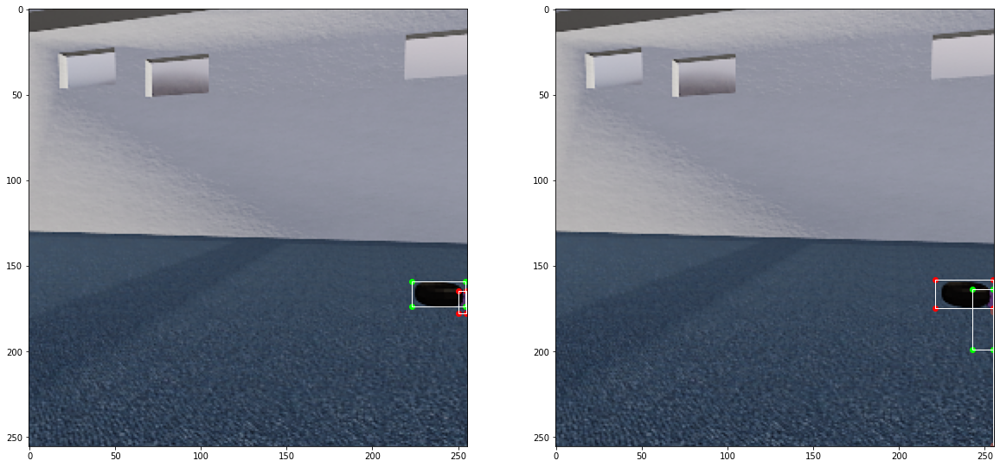

KeyError: "Unable to open object (object '0160' doesn't exist)"

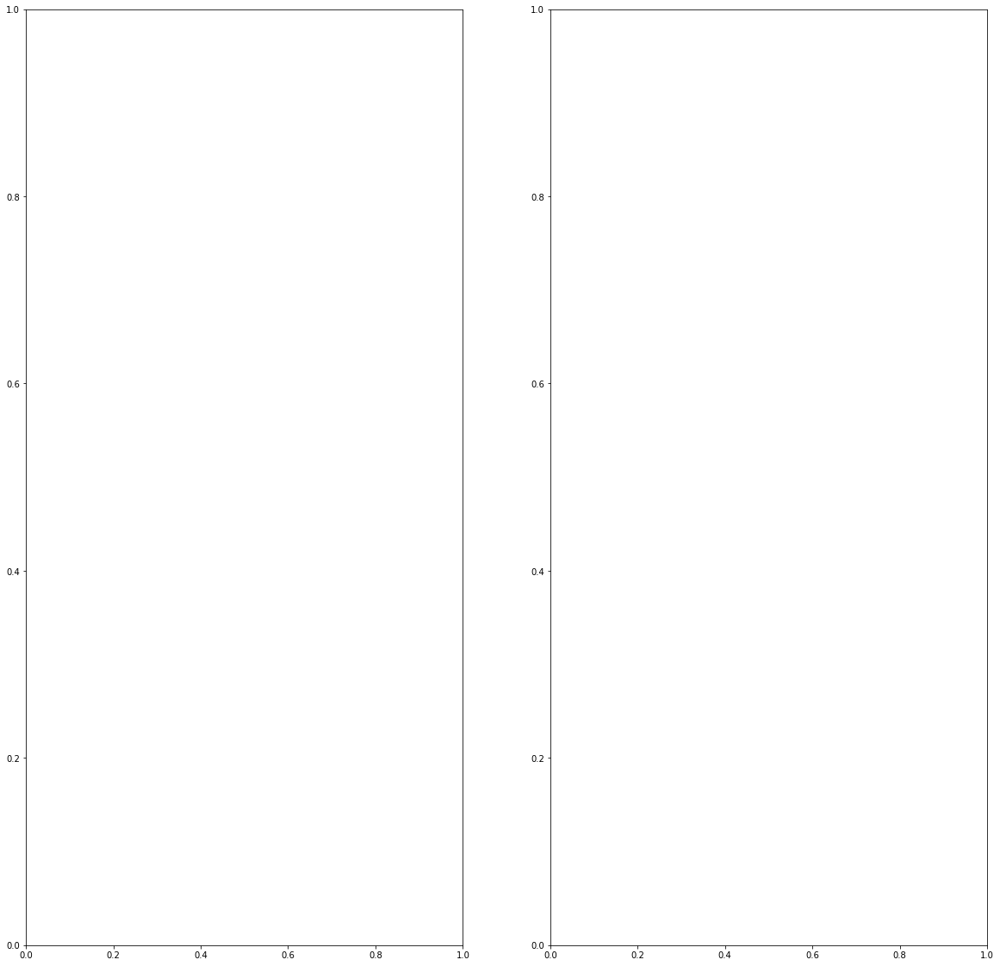

In [45]:
# filepath = "/Users/eliwang/physion_data/drop/readout_human_redyellow/pilot_it2_drop_all_bowls_box/0003.hdf5"
# filepath = '/Users/eliwang/Downloads/pilot_towers_nb5_fr015_SJ030_mono0_dis0_occ0_boxroom_0047_new.hdf5'
filepath = '/data1/eliwang/physion_data/pretraining_train_new/Collide/pilot_it2_collision_assorted_targets_box_0000.hdf5'
f = h5py.File(filepath)

for frame_no in range(0, 300, 10):
    _, axarr = plt.subplots(1,2, figsize=(20,20))
    rgb_img = get_frame(frame_no, '_img')
    axarr[0].imshow(rgb_img)
    bboxes = f['frames'][str(frame_no).zfill(4)]['bboxes'][()]
    colors = [[0, 1, 0], [1, 0, 0]] + list(getDistinctColors(len(bboxes)-2))
    for obj_id, xyxy in enumerate(bboxes):
        corners = bbox_to_corners(*xyxy)
        axarr[0].add_patch(Rectangle((xyxy[0],xyxy[1]), xyxy[2]-xyxy[0], xyxy[3]-xyxy[1], fill=None, alpha=1, color='w'))
        for c in corners:
            axarr[0].scatter(c[0], c[1], color=colors[obj_id])
    
    axarr[1].imshow(rgb_img)
    bboxes = f['frames'][str(frame_no).zfill(4)]['bboxes2'][()]
    colors = [[0, 1, 0], [1, 0, 0]] + list(getDistinctColors(len(bboxes)-2))
    for obj_id, xyxy in enumerate(bboxes):
        corners = bbox_to_corners(*xyxy)
        axarr[1].add_patch(Rectangle((xyxy[0],xyxy[1]), xyxy[2]-xyxy[0], xyxy[3]-xyxy[1], fill=None, alpha=1, color='w'))
        for c in corners:
            axarr[1].scatter(c[0], c[1], color=colors[obj_id])
            
    
    plt.show()

In [49]:
import subprocess
import cv2
def write_video(file_path, frames, fps):
    """
    Writes frames to an mp4 video file
    :param file_path: Path to output video, must end with .mp4
    :param frames: List of PIL.Image objects
    :param fps: Desired frame rate
    """

    h, w = frames[0].shape[:2]
    fourcc = cv2.cv2.VideoWriter_fourcc(*"MJPG")# cv2.VideoWriter_fourcc('m', 'p', '4', 'v')
    writer = cv2.VideoWriter(file_path, fourcc, fps, (w, h))

    for frame in frames:
        writer.write((frame[:, :, :3]*255).astype('uint8'))

    writer.release() 

In [58]:
write_video(name + '.avi', all_imgs, 30)

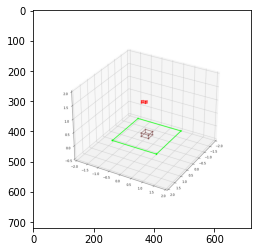

In [8]:
plt.imshow(all_imgs[0])